# MA: EXPLORATORY DATA ANALYSIS

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import warnings
from pylab import rcParams

In [2]:
pd.set_option('display.max_columns', 1000)
pd.set_option('display.max_rows', 1000)

In [3]:
%matplotlib inline
warnings.filterwarnings("ignore")
rcParams['figure.figsize'] = 20,10
rcParams['font.size'] = 30
sns.set()
np.random.seed(8)

### Load data 

In [4]:
def CustomParser(data):
    import json
    j1 = json.loads(data)
    return j1

In [5]:
demo1 = pd.read_csv("./Pro_1/demographics.csv")
end1 = pd.read_csv("./Pro_1/endsurvey.csv")
rec1 = pd.read_csv("./Condition_1_nutriscore/recipes.csv")
shown1 = pd.read_csv("./Pro_1/selectedrecipes.csv", converters={'recipe_order':CustomParser})

In [6]:
demo2 = pd.read_csv("./Pro_2/demographics.csv")
end2 = pd.read_csv("./Pro_2/endsurvey.csv")
rec2 = pd.read_csv("./Condition_2_MTL/recipes.csv")
shown2 = pd.read_csv("./Pro_2/selectedrecipes.csv", converters={'recipe_order':CustomParser})

In [7]:
demo3 = pd.read_csv("./Pro_3/demographics.csv")
end3 = pd.read_csv("./Pro_3/endsurvey.csv")
rec3 = pd.read_csv("./Condition_3_nolabel/recipes.csv")
shown3 = pd.read_csv("./Pro_3/selectedrecipes.csv", converters={'recipe_order':CustomParser})

In [34]:
recipes = pd.read_csv("recipes_correct_fsa.csv")

In [35]:
# Merge all data
md = pd.concat([demo1, demo2, demo3])
ms = pd.concat([shown1, shown2, shown3])
es = pd.concat([end1, end2, end3])
rs = recipes

## Explore the data

In [19]:
import pandas_profiling

In [20]:
pandas_profiling.ProfileReport(md)

In [21]:
pandas_profiling.ProfileReport(ms)

In [22]:
pandas_profiling.ProfileReport(es)

In [27]:
pandas_profiling.ProfileReport(rs)

In [29]:
rs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60 entries, 0 to 59
Data columns (total 51 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Unnamed_0                60 non-null     int64  
 1   Unnamed_0.1              60 non-null     int64  
 2   Unnamed_0.1.1            60 non-null     int64  
 3   recipe_id                60 non-null     object 
 4   recipe_image_link        60 non-null     object 
 5   recipe_name              60 non-null     object 
 6   recipe_description       60 non-null     object 
 7   recipe_servings          60 non-null     object 
 8   recipe_directions        60 non-null     object 
 9   recipe_directions_cnt    60 non-null     int64  
 10  recipe_serving           60 non-null     int64  
 11  recipe_calories          60 non-null     float64
 12  total_gram_weight        60 non-null     float64
 13  avg_rating               60 non-null     float64
 14  number_of_ratings        60 

In [11]:
len(md['user_id'].unique())

728

In [59]:
md.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 728 entries, 0 to 240
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Unnamed: 0       728 non-null    int64 
 1   Unnamed: 0.1     728 non-null    int64 
 2   user_id          728 non-null    int64 
 3   condnum          728 non-null    int64 
 4   iso_time         728 non-null    object
 5   prolific_id      364 non-null    object
 6   gender           728 non-null    object
 7   age              728 non-null    int64 
 8   nationality      728 non-null    object
 9   education        728 non-null    int64 
 10  experience       728 non-null    object
 11  eating_habits    728 non-null    object
 12  goal             728 non-null    object
 13  restrictions     717 non-null    object
 14  american         728 non-null    object
 15  european         728 non-null    object
 16  other_continent  728 non-null    object
dtypes: int64(6), object(11)
memory usag

In [80]:
# Age, Gender, Cooking exp, Healthiness
md['gender'].value_counts()

male      368
female    355
other       5
Name: gender, dtype: int64

KeyError: 'cooking_expereince'

In [55]:
md['experience'] = md['experience'].replace(['cmedium','chigh','clow','cveryhigh','cverylow'],['Medium','High','Low','Very High', 'Very Low'])
md['eating_habits'] = md['eating_habits'].replace(['healthy','neutral','unhealthy','vhealhty','vunhealthy'],['Healthy','Neutral','Unhealthy','Very Healthy', 'Very Unhealthy'])


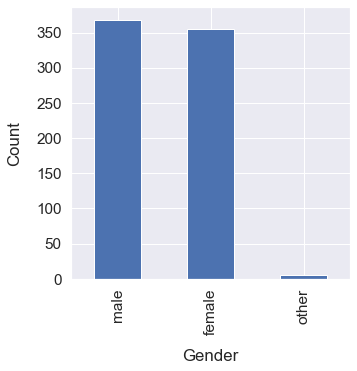

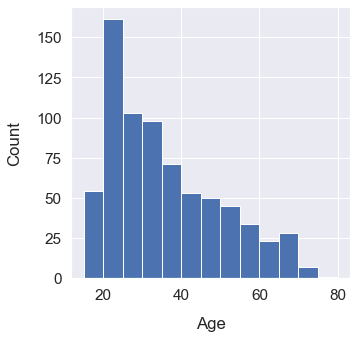

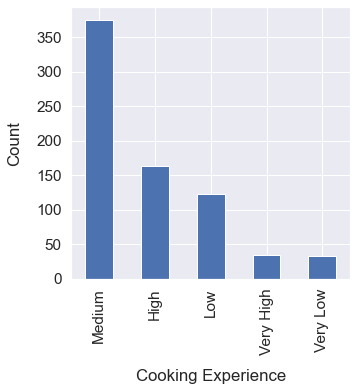

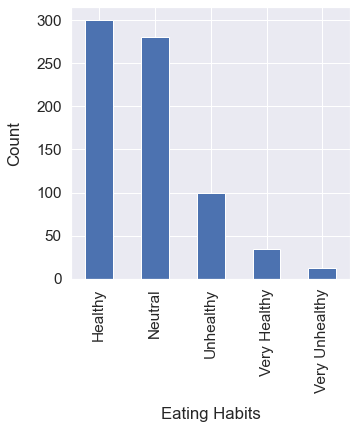

In [26]:
sns.set(font_scale=1.4)
plt.figure(figsize=(5,5))
md['gender'].value_counts().plot(kind='bar');
plt.xlabel("Gender", labelpad=14)
plt.ylabel("Count", labelpad=14)
plt.show()
plt.figure(figsize=(5,5))
md['age'].plot(kind='hist', bins=[15,20,25,30,35,40,45,50,55,60,65,70,75,80]) # `bins` defines the start and end points of bins
plt.xlabel("Age", labelpad=14)
plt.ylabel("Count", labelpad=14)
plt.show()
plt.figure(figsize=(5,5))
md['experience'].value_counts().plot(kind='bar');
plt.xlabel("Cooking Experience", labelpad=14)
plt.ylabel("Count", labelpad=14)
plt.show()
plt.figure(figsize=(5,5))
md['eating_habits'].value_counts().plot(kind='bar');
plt.xlabel("Eating Habits", labelpad=14)
plt.ylabel("Count", labelpad=14)
plt.show()



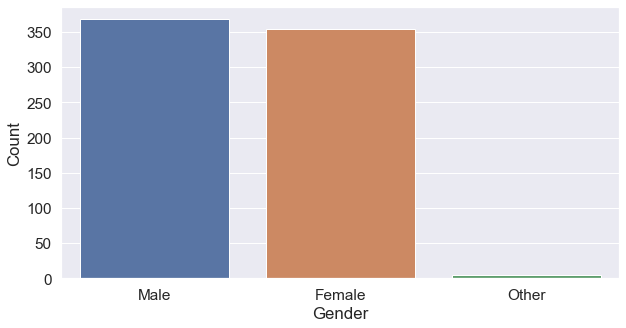

In [91]:
#fig, ax =plt.subplots(1,2)
md['gender'] = md['gender'].replace(['male','female','other'], ['Male','Female','Other'])
#sns.set(font_scale=1.4)
plt.figure(figsize=(10,5))
ax = sns.countplot(md['gender'])
#sns.countplot(md['age'], bin=[15,20,25,30,35,40,45,50,55,60,65,70,75,80], ax=ax[1])
ax.set(xlabel="Gender", ylabel = "Count")

plt.savefig('gender.png')
#fig.show()

gender
female    AxesSubplot(0.125,0.125;0.775x0.755)
male      AxesSubplot(0.125,0.125;0.775x0.755)
other     AxesSubplot(0.125,0.125;0.775x0.755)
Name: age, dtype: object

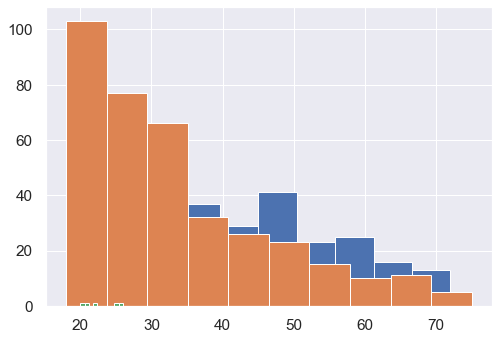

In [49]:
md.groupby('gender').age.hist()

# Plot Nutri-Score of selected recipes

In [26]:
# Selected recipes
s1 = pd.read_csv("./Pro_1/selectedrecipes.csv")
# Selected recipes
s2 = pd.read_csv("./Pro_2/selectedrecipes.csv")
# Selected recipes
s3 = pd.read_csv("./Pro_3/selectedrecipes.csv")

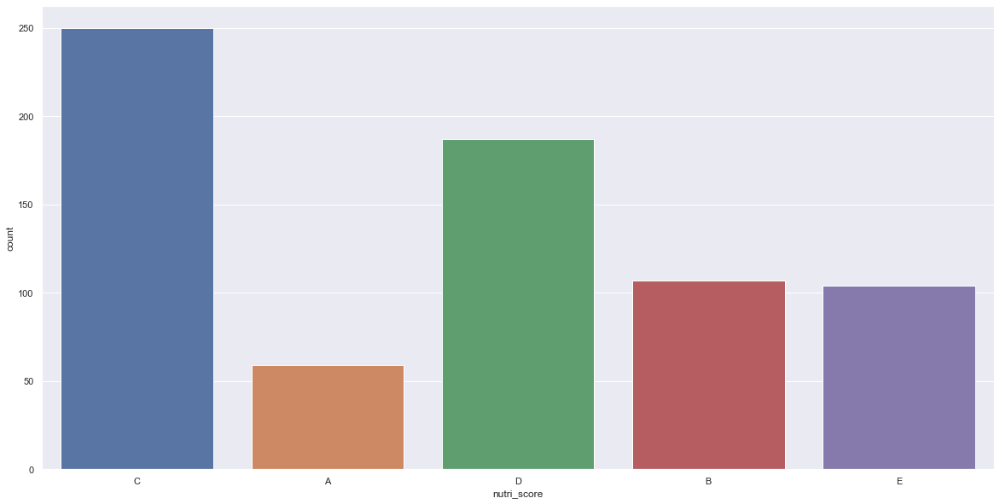

In [20]:
ax = sns.countplot(s1['nutri_score'])

In [21]:
s1['nutri_score'].value_counts()

C    250
D    187
B    107
E    104
A     59
Name: nutri_score, dtype: int64

In [23]:
s2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 717 entries, 0 to 716
Data columns (total 69 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Unnamed: 0               717 non-null    int64  
 1   Unnamed: 0_x             717 non-null    int64  
 2   user_id                  717 non-null    int64  
 3   recipe_id                717 non-null    object 
 4   load_more                0 non-null      float64
 5   recipe_order             717 non-null    object 
 6   choice_num               717 non-null    int64  
 7   condition                717 non-null    int64  
 8   submitted_at             717 non-null    object 
 9   query_term               717 non-null    object 
 10  choice_sat_q1            717 non-null    int64  
 11  choice_sat_q4            717 non-null    int64  
 12  choice_sat_q2            717 non-null    int64  
 13  choice_sat_q3            717 non-null    int64  
 14  choice_sat_q5            7

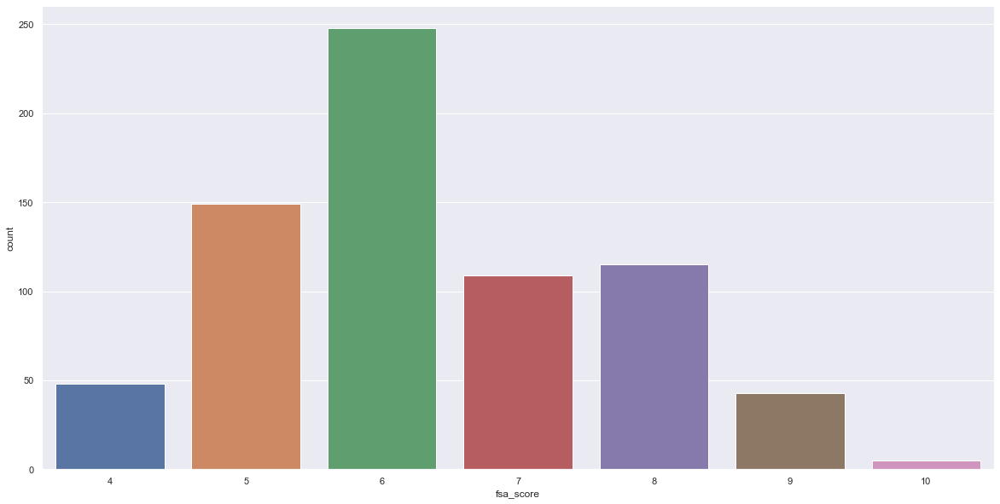

In [25]:
ax = sns.countplot(s2['fsa_score'])

# 1. What is your age? *

<AxesSubplot:xlabel='age', ylabel='count'>

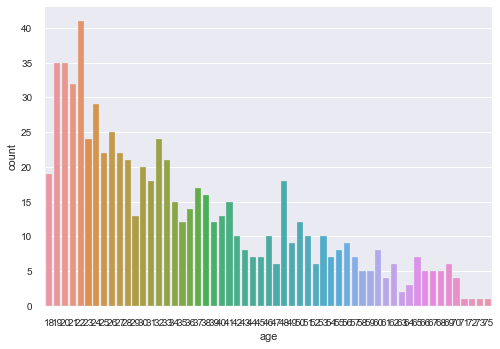

In [24]:
sns.countplot(x='age', data=md)

In [75]:
md['age'].mean()

35.34615384615385

# 2. What is your highest completed education? *
* 1 = Less than high school
* 2 = High school or equivalent
* 3 = Bacherlor degree (e.g. BA, BSc)
* 4 = Master degree (e.g. MA, MSc)
* 5 = Doctorate (e.g. PhD)
* 6 = Prefer not to say

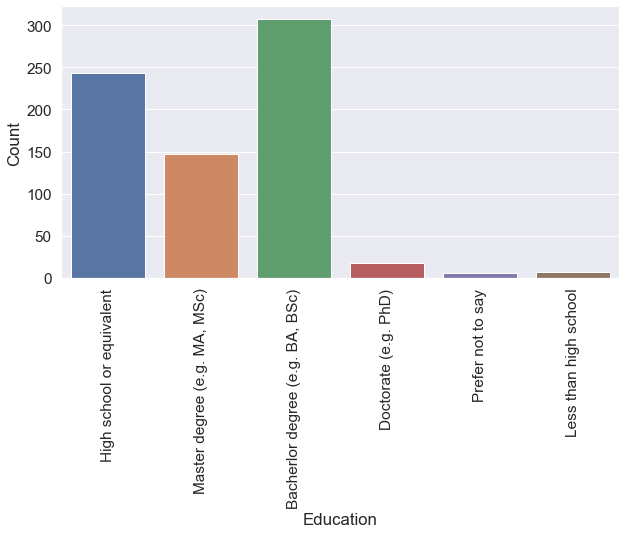

In [50]:

md['education'] = md['education'].replace([1,2,3,4,5,6],['Less than high school','High school or equivalent','Bacherlor degree (e.g. BA, BSc)','Master degree (e.g. MA, MSc)', 'Doctorate (e.g. PhD)', 'Prefer not to say'])

plt.figure(figsize=(10,5))


#sns.set(font_scale=1.4)
ax = sns.countplot(x='education', data=md)
ax.set(xlabel='Education', ylabel='Count')
plt.xticks(rotation=90)
plt.savefig('education.png', bbox_inches='tight')


In [77]:
md['education'].mean()

2.923076923076923

# 3. What is your nationality? *

In [115]:
md.loc[md['nationality'].str.contains('american|united states|usa|us|new york', case=False), 'nationality'] = 'American'
md.loc[md['nationality'].str.contains('british|uk|english', case=False), 'nationality'] = 'UK'
md.loc[md['nationality'].str.contains('poland|polish', case=False), 'nationality'] = 'Polish'

In [116]:
md['nationality'].str.lower().value_counts()

american                349
polish                   88
portuguese               72
uk                       37
italian                  20
greek                    19
mexican                  15
spanish                   9
hungarian                 9
white                     8
french                    8
south african             4
dutch                     4
canadian                  4
irish                     4
estonian                  4
danish                    3
latvian                   3
spain                     3
slovenian                 3
italy                     3
indian                    3
finnish                   3
belgian                   2
israel                    2
slovene                   2
norwegian                 2
asian                     2
czech                     2
catholic                  1
italian                   1
kenyan                    1
german                    1
myanmar                   1
united state              1
sierra leonean      

### Plot the top 10 nationalities 

<AxesSubplot:xlabel='nationality', ylabel='count'>

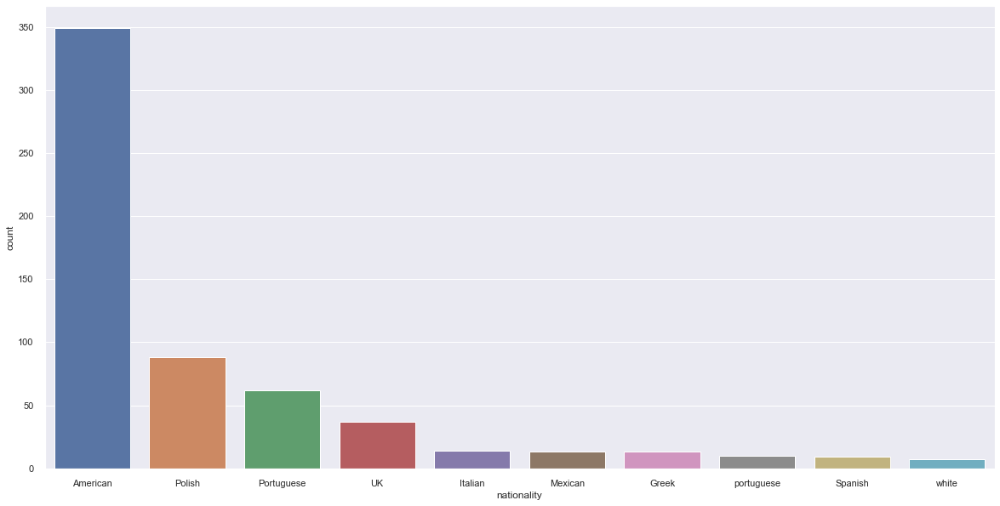

In [121]:
sns.countplot(x='nationality', 
              data=md, 
              order=pd.value_counts(md['nationality']).iloc[:10].index)

# 4. What is your gender? *

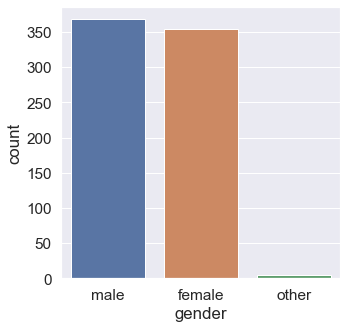

In [53]:
plt.figure(figsize=(5,5))

sns.countplot(x='gender', data=md)

ax.set(xlabel='Gender', ylabel='Count')
plt.savefig('gender.png', bbox_inches='tight')


In [122]:
md['gender'].value_counts()

male      368
female    355
other       5
Name: gender, dtype: int64

# 5. Do you have any dietary restrictions? *

In [140]:
test = md['restrictions'].apply(lambda x: x[1:-1].split(','))
restriction_count = pd.Series(sum([item for item in test], [])).value_counts()
restriction_count

"none"                                                   567
"vegan"                                                   65
"lactose"                                                 36
"gluten"                                                  22
"halal"                                                   14
"allergies"                                               12
"pescatarian"                                             11
                                                          11
"Vegan"                                                    5
"no pork"                                                  2
"Shell Fish "                                              1
"no nuts"                                                  1
"Flexitarian? At home only vegetarian                      1
"low fodmap"                                               1
 but no restriction when with friends or restaurants"      1
"low fat"                                                  1
"allergy to shellfish"  

# 6. Do you have any dietary goals? *

In [120]:
goal = md['goal'].apply(lambda x: x[1:-1].split(','))
goal_count = pd.Series(sum([item for item in goal], [])).value_counts()
goal_count

"lweight"                                      308
"vegetables"                                   236
"none"                                         197
"fruit"                                        161
"protein"                                      141
"salt"                                          89
"gweight"                                       57
"Eat less meat"                                  5
"Eat less sugar"                                 3
"eat less sugar"                                 2
"dont eat much meat"                             1
"less fat"                                       1
"Intermittent fasting daily"                     1
"less meat"                                      1
"Eat less fat"                                   1
"stop eating refined sugar "                     1
"Lose fat"                                       1
"maintain current weight or a litttle less"      1
"Keep weight"                                    1
"Less meat"                    

# 7. I consider my cooking experience to be: *

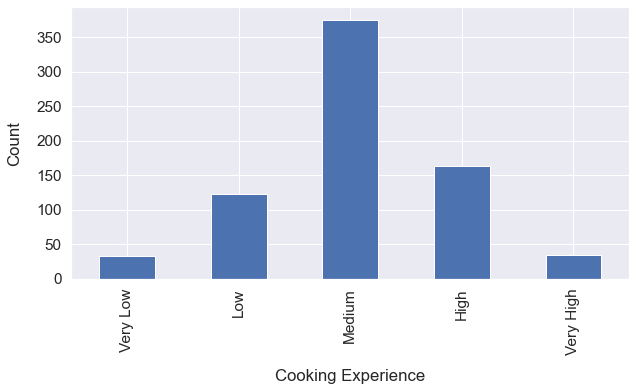

In [76]:

plt.figure(figsize=(10,5))

sns.set(font_scale=1.4)

md['experience'].value_counts()[["Very Low", "Low", "Medium", "High", "Very High"]].plot(kind="bar")
plt.xlabel("Cooking Experience", labelpad=14)
plt.ylabel("Count", labelpad=14)
plt.savefig('cooking_experience.png', bbox_inches='tight')


[Text(0.5, 22.19999999999999, 'Cooking experience'),
 Text(22.200000000000003, 0.5, 'Count')]

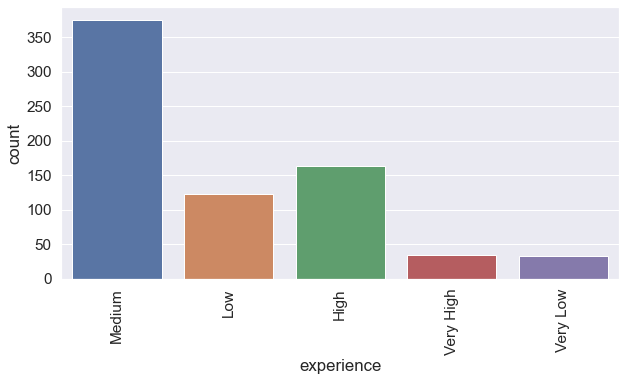

In [74]:

plt.figure(figsize=(10,5))


#sns.set(font_scale=1.4)

plt.xticks(rotation=90)
#plt.savefig('education.png', bbox_inches='tight')


sns.countplot(x='experience', data=md)
ax.set(xlabel='Cooking experience', ylabel='Count')


# 8. I consider my eating habits to be: *

In [71]:
md['eating_habits'].value_counts()

Healthy           300
Neutral           280
Unhealthy         100
Very Healthy       35
Very Unhealthy     13
Name: eating_habits, dtype: int64

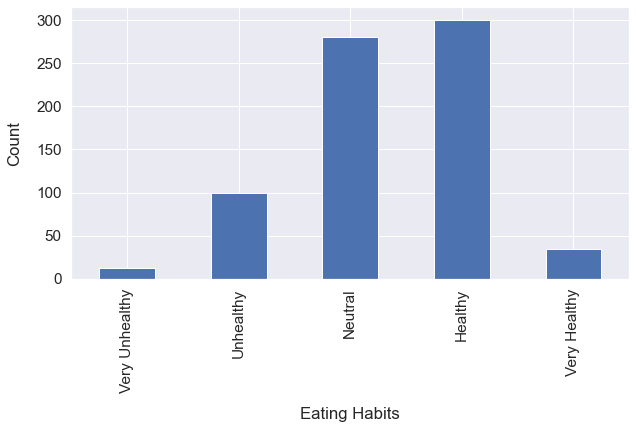

In [75]:



plt.figure(figsize=(10,5))

sns.set(font_scale=1.4)

md['eating_habits'].value_counts()[["Very Unhealthy", "Unhealthy", "Neutral", "Healthy", "Very Healthy"]].plot(kind="bar")

plt.xlabel("Eating Habits", labelpad=14)
plt.ylabel("Count", labelpad=14)
plt.savefig('eating_habits.png', bbox_inches='tight')


# Explore selected recipes

### What were the most selected recipes? 

In [444]:
most_sel = ms.recipe_id.apply(lambda x: x.split(','))
most_sel = pd.Series(sum([item for item in most_sel], [])).value_counts()
most_sel = pd.DataFrame({'recipe_id':most_sel.index, 'count':most_sel.values})

most_sel_rec = pd.merge(most_sel,rec1[['recipe_id','avg_rating', 'number_of_ratings','nutri_score', 'fat_mtl_score','saturated_fat_mtl_score','sugar_mtl','sodium_mtl','fsa_score']],on='recipe_id', how='left')
most_sel_rec.head(100)

,recipe_id,count,avg_rating,number_of_ratings,nutri_score,fat_mtl_score,saturated_fat_mtl_score,sugar_mtl,sodium_mtl,fsa_score
0,http://allrecipes.com/recipe/tomato-and-garlic...,91,4.36170,47,C,low,low,low,low,4
1,http://allrecipes.com/recipe/baked-lemon-chick...,76,4.16892,148,C,medium,medium,low,low,6
2,http://allrecipes.com/recipe/fruit-salad-in-se...,74,4.50000,94,D,low,low,medium,low,5
3,http://allrecipes.com/recipe/pasta-chickpea-sa...,67,3.50000,10,A,medium,low,low,low,5
4,http://allrecipes.com/recipe/champagne-shrimp-...,62,4.66355,107,C,medium,medium,low,low,6
5,http://allrecipes.com/recipe/chicken-breasts-w...,61,4.43511,131,C,medium,medium,low,low,6
6,http://allrecipes.com/recipe/chicken-tikka-mas...,61,4.43249,474,E,medium,high,low,high,9
7,http://allrecipes.com/recipe/restaurant-style-...,60,4.57325,157,B,medium,medium,low,medium,7
8,http://allrecipes.com/recipe/easy-honey-mustar...,58,4.43158,190,D,medium,medium,medium,medium,8
9,http://allrecipes.com/recipe/panzanella-salad/...,56,4.60909,110,D,medium,medium,low,medium,7


### How often did participants choose the 1st recipe? 

In [106]:
# Create new dataframe with one column for each recipe order number
order =  ms['recipe_order'].apply(pd.Series)

In [119]:
number_of_1 = order[order['0'] == ms['recipe_id']]
number_of_2 = order[order['1'] == ms['recipe_id']]
number_of_3 = order[order['2'] == ms['recipe_id']]
number_of_4 = order[order['3'] == ms['recipe_id']]
number_of_5 = order[order['4'] == ms['recipe_id']]
number_of_6 = order[order['5'] == ms['recipe_id']]
number_of_8 = order[order['6'] == ms['recipe_id']]
number_of_7 = order[order['7'] == ms['recipe_id']]
number_of_9 = order[order['8'] == ms['recipe_id']]
number_of_10 = order[order['9'] == ms['recipe_id']]
number_of_11 = order[order['1'] == ms['recipe_id']]
number_of_12 = order[order['11'] == ms['recipe_id']]
number_of_13 = order[order['12'] == ms['recipe_id']]
number_of_14 = order[order['13'] == ms['recipe_id']]
number_of_15 = order[order['14'] == ms['recipe_id']]
number_of_16 = order[order['15'] == ms['recipe_id']]
number_of_17 = order[order['16'] == ms['recipe_id']]
number_of_18 = order[order['17'] == ms['recipe_id']]
number_of_19 = order[order['18'] == ms['recipe_id']]
number_of_20 = order[order['19'] == ms['recipe_id']]

print("1:", len(number_of_1), "of", len(ms) )
print("2:", len(number_of_2), "of", len(ms) )
print("3:", len(number_of_3), "of", len(ms) )
print("4:", len(number_of_4), "of", len(ms) )
print("5:", len(number_of_5), "of", len(ms) )
print("6:", len(number_of_6), "of", len(ms) )
print("7:", len(number_of_7), "of", len(ms) )
print("8:", len(number_of_8), "of", len(ms) )
print("9:", len(number_of_9), "of", len(ms) )
print("10:", len(number_of_10), "of", len(ms) )
print("11:", len(number_of_11), "of", len(ms) )
print("12:", len(number_of_12), "of", len(ms) )
print("13:", len(number_of_13), "of", len(ms) )
print("14:", len(number_of_14), "of", len(ms) )
print("15:", len(number_of_15), "of", len(ms) )
print("16:", len(number_of_16), "of", len(ms) )
print("17:", len(number_of_17), "of", len(ms) )
print("18:", len(number_of_18), "of", len(ms) )
print("19:", len(number_of_19), "of", len(ms) )
print("20:", len(number_of_20), "of", len(ms) )

1: 204 of 2184
2: 147 of 2184
3: 180 of 2184
4: 157 of 2184
5: 139 of 2184
6: 148 of 2184
7: 106 of 2184
8: 130 of 2184
9: 96 of 2184
10: 153 of 2184
11: 147 of 2184
12: 88 of 2184
13: 60 of 2184
14: 60 of 2184
15: 88 of 2184
16: 52 of 2184
17: 64 of 2184
18: 55 of 2184
19: 74 of 2184
20: 80 of 2184


# Explore healthiness of selected recipes between conditions

In [ ]:
# Get FSA score for different variants in all conditions
s1_fsa = shown1["fsa_score"].mean()
s2_fsa = shown2["fsa_score"].mean()
s3_fsa = shown3["fsa_score"].mean()

# Get Nutriscore  for different variants
s1_ns = shown1['nutri_score'].to_numpy()
s2_ns = shown2['nutri_score'].to_numpy()
s3_ns = shown3['nutri_score'].to_numpy()



# Explore healthiness of recipes within-subjects (popular, Random, Health)

In [ ]:
# Get data for each within-subjects variable
# Condition 1 variants
s1v1 = shown1.loc[shown1['variant'] == 1]
s1v2 = shown1.loc[shown1['variant'] == 2]
s1v3 = shown1.loc[shown1['variant'] == 3]

# Condition 2 variants
s2v1 = shown2.loc[shown2['variant'] == 1]
s2v2 = shown2.loc[shown2['variant'] == 2]
s2v3 = shown2.loc[shown2['variant'] == 3]

# Condition 3 variants
s3v1 = shown3.loc[shown3['variant'] == 1]
s3v2 = shown3.loc[shown3['variant'] == 2]
s3v3 = shown3.loc[shown3['variant'] == 3]


# Get FSA score for different within-subjects variable
s1v1_fsa = s1v1['fsa_score'].to_numpy()
s1v2_fsa = s1v2['fsa_score'].to_numpy()
s1v3_fsa = s1v3['fsa_score'].to_numpy()

s2v1_fsa = s2v1['fsa_score'].to_numpy()
s2v2_fsa = s2v2['fsa_score'].to_numpy()
s2v3_fsa = s2v3['fsa_score'].to_numpy()

s3v1_fsa = s3v1['fsa_score'].to_numpy()
s3v2_fsa = s3v2['fsa_score'].to_numpy()
s3v3_fsa = s3v3['fsa_score'].to_numpy()

# Get Nutriscore  for different within-subjects variable
s1v1_ns = s1v1['nutri_score'].to_numpy()
s1v2_ns = s1v2['nutri_score'].to_numpy()
s1v3_ns = s1v3['nutri_score'].to_numpy()

s1v1_ns = s1v1['nutri_score'].to_numpy()
s1v2_ns = s1v2['nutri_score'].to_numpy()
s1v3_ns = s1v3['nutri_score'].to_numpy()

s1v1_ns = s1v1['nutri_score'].to_numpy()
s1v2_ns = s1v2['nutri_score'].to_numpy()
s1v3_ns = s1v3['nutri_score'].to_numpy()

In [ ]:
# Compare
print("----------------- Condition 1 Nutri-Score -----------------")
print("Mean v1: Popular:", s1v1['choice_sat_q6'].mean())
print("Mean v2: Random", s1v2['choice_sat_q6'].mean())
print("Mean v3: Health", s1v3['choice_sat_q6'].mean())

print("----------------- Condition 2 MTL -----------------")
print("Mean v1: Popular:", s2v1['choice_sat_q6'].mean())
print("Mean v2: Random", s2v2['choice_sat_q6'].mean())
print("Mean v3: Health", s2v3['choice_sat_q6'].mean())

print("----------------- Condition 3 No label -----------------")
print("Mean v1: Popular:", s3v1['choice_sat_q6'].mean())
print("Mean v2: Random", s3v2['choice_sat_q6'].mean())
print("Mean v3: Health", s3v3['choice_sat_q6'].mean())

fig, axs = plt.subplots(ncols=3, nrows=3)
sns.countplot(x='choice_sat_q6', data=s1v1, ax=axs[0, 0])
sns.countplot(x='choice_sat_q6', data=s1v2, ax=axs[0, 1])
sns.countplot(x='choice_sat_q6', data=s1v3, ax=axs[0, 2])

sns.countplot(x='choice_sat_q6', data=s2v1, ax=axs[1, 0])
sns.countplot(x='choice_sat_q6', data=s2v2, ax=axs[1, 1])
sns.countplot(x='choice_sat_q6', data=s2v3, ax=axs[1, 2])

sns.countplot(x='choice_sat_q6', data=s3v1, ax=axs[2, 0])
sns.countplot(x='choice_sat_q6', data=s3v2, ax=axs[2, 1])
sns.countplot(x='choice_sat_q6', data=s3v3, ax=axs[2, 2])

# RQ3: Recipe choice questionnaire: Choice satisfaction answers
* -2 = Strongly disagree
* -1 = Disagree
*  0 = Neither disagree/agree
*  1 = Agree
*  2 = Strongly agree

## Are there any obvius differences in choie satisfaction between conditions? 

### 1. I would recommend the chosen recipe to others

----------------- Condition 1 Nutri-Score -----------------
 1    423
 2    154
 0    123
-1     20
-2      7
Name: choice_sat_q1, dtype: int64
Mean: 0.9587345254470426
----------------- Condition 2 MTL -----------------
 1    460
 2    134
 0    125
-1     15
-2      2
Name: choice_sat_q1, dtype: int64
Mean: 0.9633152173913043
----------------- Condition 3 No label -----------------
 1    428
 0    156
 2    108
-1     22
-2      7
Name: choice_sat_q1, dtype: int64
Mean: 0.8432732316227461


<AxesSubplot:xlabel='choice_sat_q1', ylabel='count'>

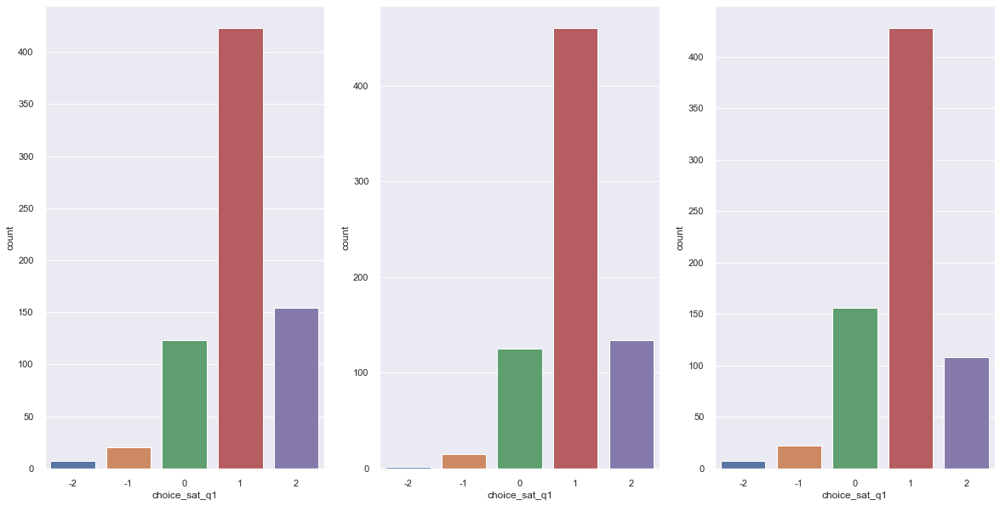

In [368]:
# Condition 1 Nutri-Score
print("----------------- Condition 1 Nutri-Score -----------------")
print(shown1['choice_sat_q1'].value_counts())
print("Mean:", shown1['choice_sat_q1'].mean())

# Condition 2 MTL
print("----------------- Condition 2 MTL -----------------")
print(shown2['choice_sat_q1'].value_counts())
print("Mean:", shown2['choice_sat_q1'].mean())


# Condition 3 No label
print("----------------- Condition 3 No label -----------------")
print(shown3['choice_sat_q1'].value_counts())
print("Mean:", shown3['choice_sat_q1'].mean())

# Compare
fig, axs = plt.subplots(ncols=3)
sns.countplot(x='choice_sat_q1', data=shown1, ax=axs[0])
sns.countplot(x='choice_sat_q1', data=shown2, ax=axs[1])
sns.countplot(x='choice_sat_q1', data=shown3, ax=axs[2])

### 2. My chosen recipe could become one of my favorites


----------------- Condition 1 Nutri-Score -----------------
-1    278
 1    185
-2    121
 0     97
 2     46
Name: choice_sat_q2, dtype: int64
Mean: -0.3342503438789546
----------------- Condition 2 MTL -----------------
-1    295
 1    197
-2    126
 0     81
 2     37
Name: choice_sat_q2, dtype: int64
Mean: -0.375
----------------- Condition 3 No label -----------------
-1    286
 1    195
-2    113
 0     99
 2     28
Name: choice_sat_q2, dtype: int64
Mean: -0.361997226074896


<AxesSubplot:xlabel='choice_sat_q2', ylabel='count'>

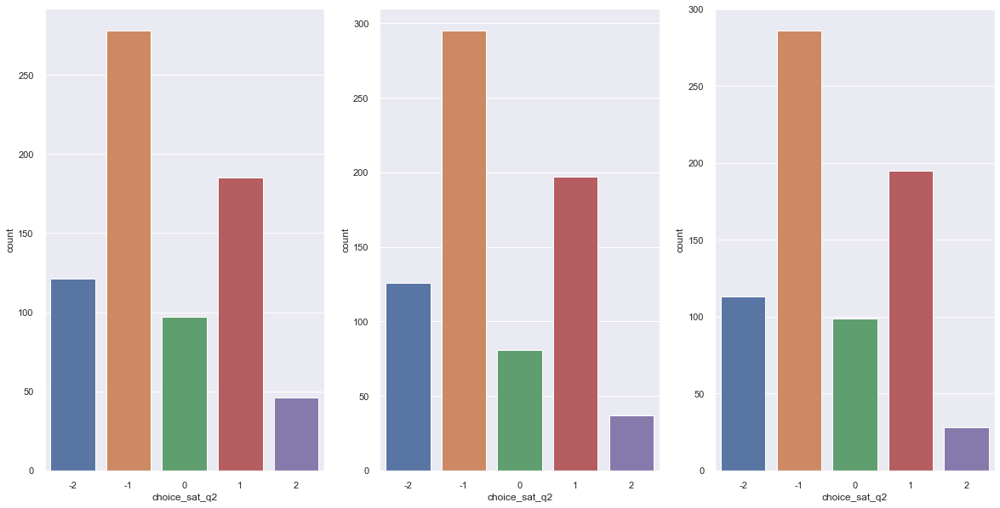

In [367]:
# Condition 1 Nutri-Score
print("----------------- Condition 1 Nutri-Score -----------------")
print(shown1['choice_sat_q2'].value_counts())
print("Mean:", shown1['choice_sat_q2'].mean())

# Condition 2 MTL
print("----------------- Condition 2 MTL -----------------")
print(shown2['choice_sat_q2'].value_counts())
print("Mean:", shown2['choice_sat_q2'].mean())


# Condition 3 No label
print("----------------- Condition 3 No label -----------------")
print(shown3['choice_sat_q2'].value_counts())
print("Mean:", shown3['choice_sat_q2'].mean())

# Compare
fig, axs = plt.subplots(ncols=3)
sns.countplot(x='choice_sat_q2', data=shown1, ax=axs[0])
sns.countplot(x='choice_sat_q2', data=shown2, ax=axs[1])
sns.countplot(x='choice_sat_q2', data=shown3, ax=axs[2])

### 3. I think I would enjoy eating the chosen recipe


----------------- Condition 1 Nutri-Score -----------------
 1    331
 0    176
 2    173
-1     33
-2     14
Name: choice_sat_q3, dtype: int64
Mean: 0.8473177441540578
----------------- Condition 2 MTL -----------------
 1    369
 0    173
 2    138
-1     43
-2     13
Name: choice_sat_q3, dtype: int64
Mean: 0.782608695652174
----------------- Condition 3 No label -----------------
 1    335
 0    190
 2    136
-1     48
-2     12
Name: choice_sat_q3, dtype: int64
Mean: 0.7420249653259362


<AxesSubplot:xlabel='choice_sat_q3', ylabel='count'>

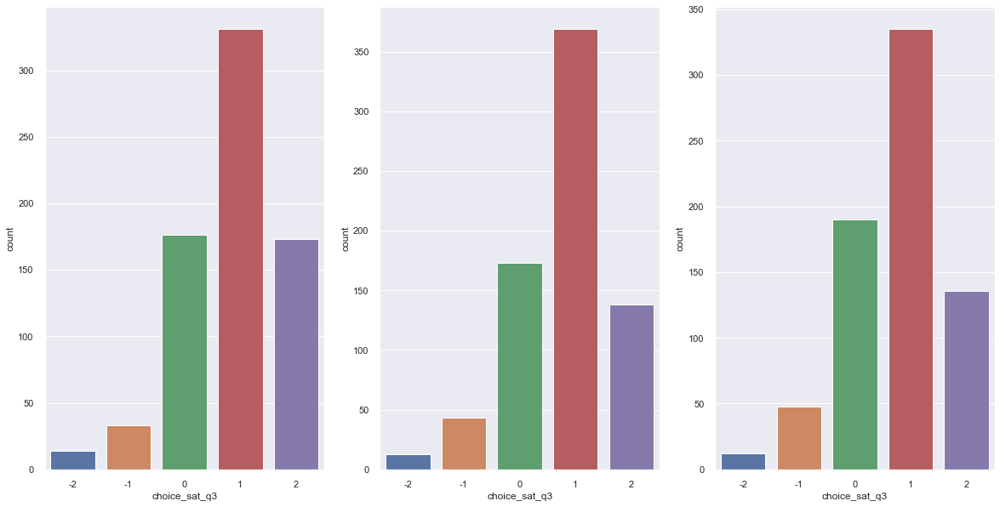

In [366]:
# Condition 1 Nutri-Score
print("----------------- Condition 1 Nutri-Score -----------------")
print(shown1['choice_sat_q3'].value_counts())
print("Mean:", shown1['choice_sat_q3'].mean())

# Condition 2 MTL
print("----------------- Condition 2 MTL -----------------")
print(shown2['choice_sat_q3'].value_counts())
print("Mean:", shown2['choice_sat_q3'].mean())


# Condition 3 No label
print("----------------- Condition 3 No label -----------------")
print(shown3['choice_sat_q3'].value_counts())
print("Mean:", shown3['choice_sat_q3'].mean())

# Compare
fig, axs = plt.subplots(ncols=3)
sns.countplot(x='choice_sat_q3', data=shown1, ax=axs[0])
sns.countplot(x='choice_sat_q3', data=shown2, ax=axs[1])
sns.countplot(x='choice_sat_q3', data=shown3, ax=axs[2])

# RQ2: Recipe choice questionnaire: Choice difficulty answers
* -2 = Strongly disagree
* -1 = Disagree
*  0 = Neither disagree/agree
*  1 = Agree
*  2 = Strongly agree

## Are there any obvious differences in choice difficulty between conditions? 

### 4. I changed my mind several times before making a decision

----------------- Condition 1 Nutri-Score -----------------
 1    367
 2    288
 0     53
-2     10
-1      9
Name: choice_sat_q4, dtype: int64
Mean: 1.2572214580467675
----------------- Condition 2 MTL -----------------
 1    384
 2    299
 0     40
-1      8
-2      5
Name: choice_sat_q4, dtype: int64
Mean: 1.309782608695652
----------------- Condition 3 No label -----------------
 1    408
 2    251
 0     45
-1      9
-2      8
Name: choice_sat_q4, dtype: int64
Mean: 1.2274618585298196


<AxesSubplot:xlabel='choice_sat_q4', ylabel='count'>

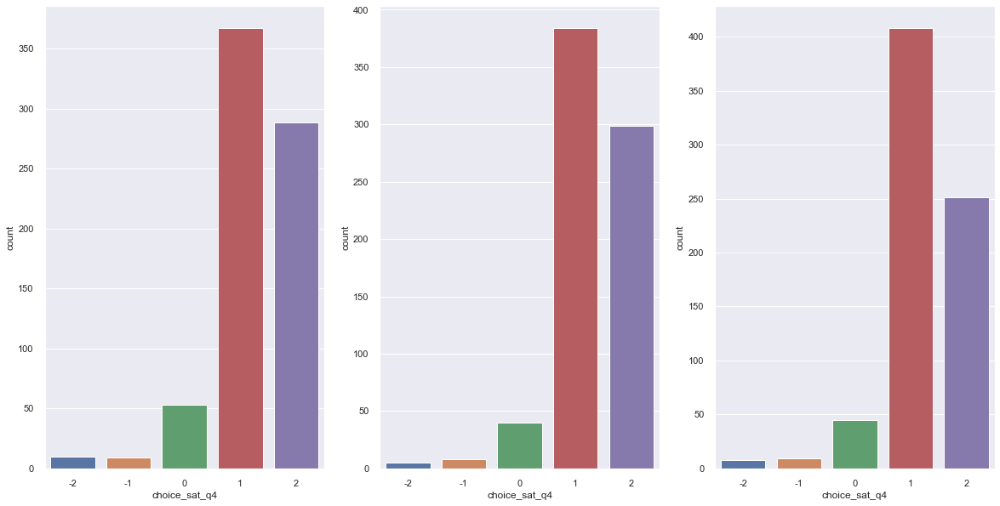

In [365]:
# Condition 1 Nutri-Score
print("----------------- Condition 1 Nutri-Score -----------------")
print(shown1['choice_sat_q4'].value_counts())
print("Mean:", shown1['choice_sat_q4'].mean())

# Condition 2 MTL
print("----------------- Condition 2 MTL -----------------")
print(shown2['choice_sat_q4'].value_counts())
print("Mean:", shown2['choice_sat_q4'].mean())


# Condition 3 No label
print("----------------- Condition 3 No label -----------------")
print(shown3['choice_sat_q4'].value_counts())
print("Mean:", shown3['choice_sat_q4'].mean())

# Compare
fig, axs = plt.subplots(ncols=3)
sns.countplot(x='choice_sat_q4', data=shown1, ax=axs[0])
sns.countplot(x='choice_sat_q4', data=shown2, ax=axs[1])
sns.countplot(x='choice_sat_q4', data=shown3, ax=axs[2])

### 5. It was easy to make this choice

----------------- Condition 1 Nutri-Score -----------------
 1    331
 2    140
-1    124
 0    110
-2     22
Name: choice_sat_q5, dtype: int64
Mean: 0.609353507565337
----------------- Condition 2 MTL -----------------
 1    337
-1    144
 2    140
 0    100
-2     15
Name: choice_sat_q5, dtype: int64
Mean: 0.6019021739130435
----------------- Condition 3 No label -----------------
 1    313
-1    165
 2    117
 0    115
-2     11
Name: choice_sat_q5, dtype: int64
Mean: 0.49930651872399445


<AxesSubplot:xlabel='choice_sat_q5', ylabel='count'>

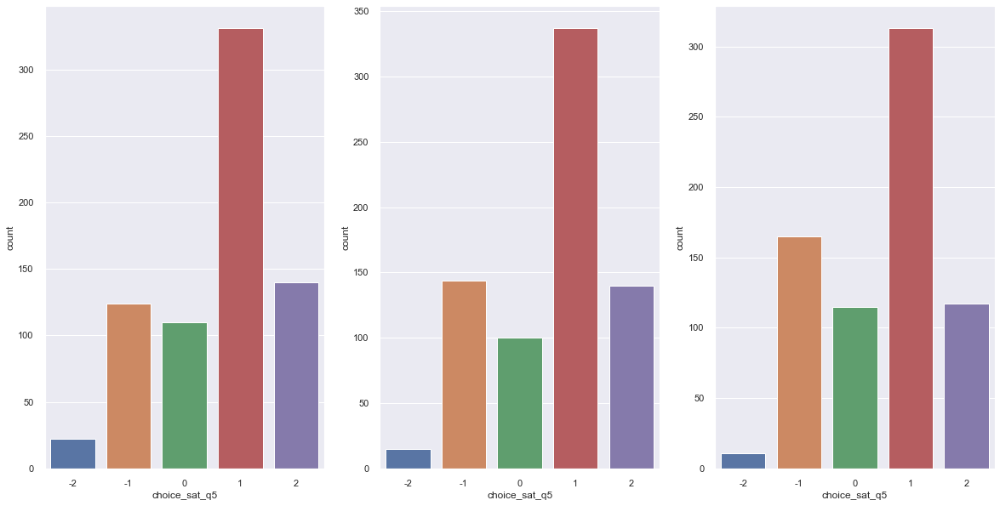

In [363]:
# Condition 1 Nutri-Score
print("----------------- Condition 1 Nutri-Score -----------------")
print(shown1['choice_sat_q5'].value_counts())
print("Mean:", shown1['choice_sat_q5'].mean())

# Condition 2 MTL
print("----------------- Condition 2 MTL -----------------")
print(shown2['choice_sat_q5'].value_counts())
print("Mean:", shown2['choice_sat_q5'].mean())


# Condition 3 No label
print("----------------- Condition 3 No label -----------------")
print(shown3['choice_sat_q5'].value_counts())
print("Mean:", shown3['choice_sat_q5'].mean())

# Compare
fig, axs = plt.subplots(ncols=3)
sns.countplot(x='choice_sat_q5', data=shown1, ax=axs[0])
sns.countplot(x='choice_sat_q5', data=shown2, ax=axs[1])
sns.countplot(x='choice_sat_q5', data=shown3, ax=axs[2])

### 6. Making a choice was overwhelming

----------------- Condition 1 Nutri-Score -----------------
-1    289
-2    171
 0    123
 1    114
 2     30
Name: choice_sat_q6, dtype: int64
Mean: -0.6286107290233838
----------------- Condition 2 MTL -----------------
-1    307
-2    216
 0    117
 1     78
 2     18
Name: choice_sat_q6, dtype: int64
Mean: -0.8491847826086957
----------------- Condition 3 No label -----------------
-1    322
-2    179
 0    111
 1     92
 2     17
Name: choice_sat_q6, dtype: int64
Mean: -0.768377253814147


<AxesSubplot:xlabel='choice_sat_q6', ylabel='count'>

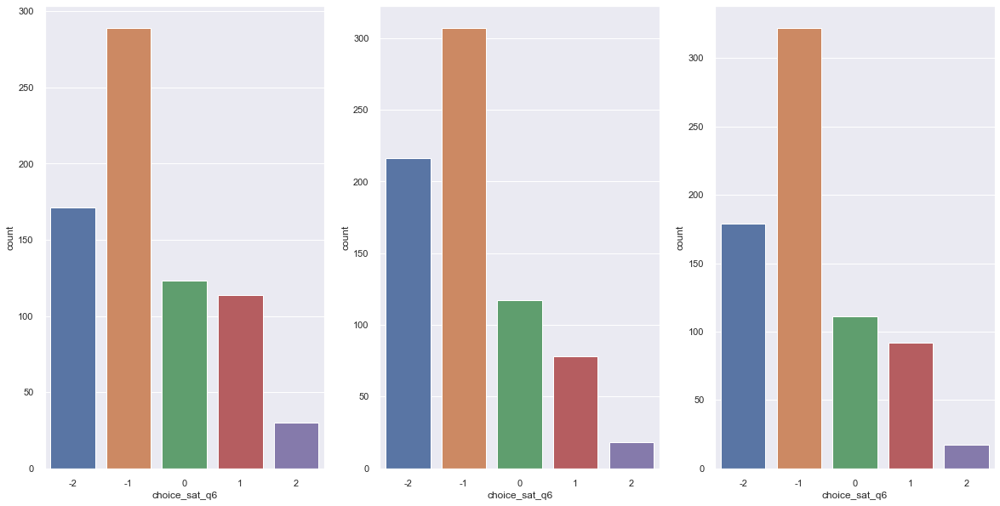

In [362]:
# Condition 1 Nutri-Score
print("----------------- Condition 1 Nutri-Score -----------------")
print(shown1['choice_sat_q6'].value_counts())
print("Mean:", shown1['choice_sat_q6'].mean())

# Condition 2 MTL
print("----------------- Condition 2 MTL -----------------")
print(shown2['choice_sat_q6'].value_counts())
print("Mean:", shown2['choice_sat_q6'].mean())


# Condition 3 No label
print("----------------- Condition 3 No label -----------------")
print(shown3['choice_sat_q6'].value_counts())
print("Mean:", shown3['choice_sat_q6'].mean())

# Compare
fig, axs = plt.subplots(ncols=3)
sns.countplot(x='choice_sat_q6', data=shown1, ax=axs[0])
sns.countplot(x='choice_sat_q6', data=shown2, ax=axs[1])
sns.countplot(x='choice_sat_q6', data=shown3, ax=axs[2])

# Post questionnaire about label information:
* -2 = Strongly disagree
* -1 = Disagree
*  0 = Neither disagree/agree
*  1 = Agree
*  2 = Strongly agree

## Are there any obvious differences between conditions with regards to how easy it was to judge the healthiness of the recipes?
* It looks like there is. MTL is the winner

### 1. It was easy to judge the healthiness of the recipes

----------------- Condition 1 Nutri-Score -----------------
 1    161
 0     32
-1     26
 2     25
-2      1
Mean: 0.746938775510204
----------------- Condition 2 MTL -----------------
 1    169
 2     38
 0     27
-1     12
-2      1
Mean: 0.9352226720647774
----------------- Condition 3 No label -----------------
 1    133
 0     57
-1     37
 2     16
-2      1
Mean: 0.5163934426229508


<AxesSubplot:xlabel='label_q1', ylabel='count'>

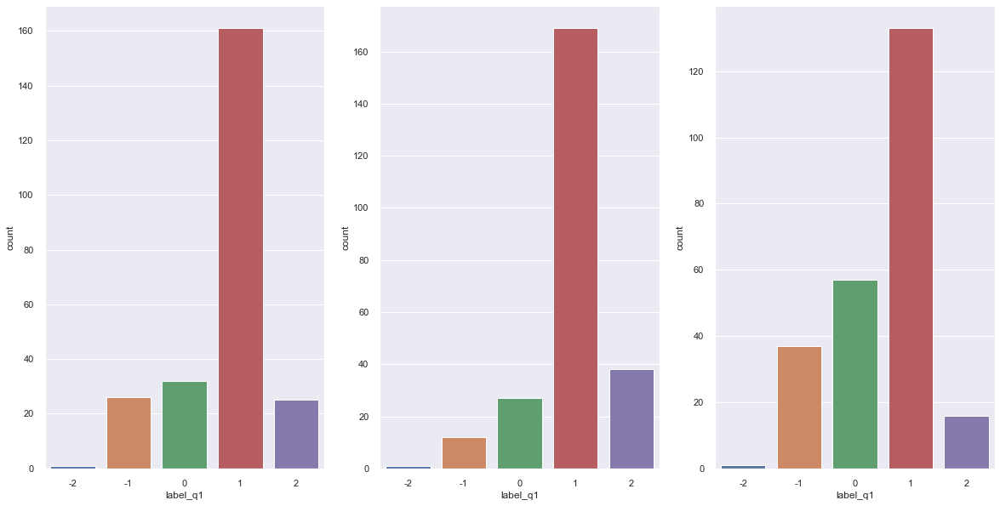

In [408]:
# Condition 1 Nutri-Score
print("----------------- Condition 1 Nutri-Score -----------------")
print(end1['label_q1'].value_counts().to_string())
print("Mean:", end1['label_q1'].mean())

# Condition 2 MTL
print("----------------- Condition 2 MTL -----------------")
print(end2['label_q1'].value_counts().to_string())
print("Mean:", end2['label_q1'].mean())

# Condition 3 No label
print("----------------- Condition 3 No label -----------------")
print(end3['label_q1'].value_counts().to_string())
print("Mean:", end3['label_q1'].mean())

# Compare
fig, axs = plt.subplots(ncols=3)
sns.countplot(x='label_q1', data=end1, ax=axs[0])
sns.countplot(x='label_q1', data=end2, ax=axs[1])
sns.countplot(x='label_q1', data=end3, ax=axs[2])

### 2. The information provided was sufficient for me to make a decision

----------------- Condition 1 Nutri-Score -----------------
 1    161
 0     32
-1     26
 2     25
-2      1
Mean: 0.746938775510204
----------------- Condition 2 MTL -----------------
 1    169
 2     38
 0     27
-1     12
-2      1
Mean: 0.9352226720647774
----------------- Condition 3 No label -----------------
 1    133
 0     57
-1     37
 2     16
-2      1
Mean: 0.5163934426229508


<AxesSubplot:xlabel='label_q2', ylabel='count'>

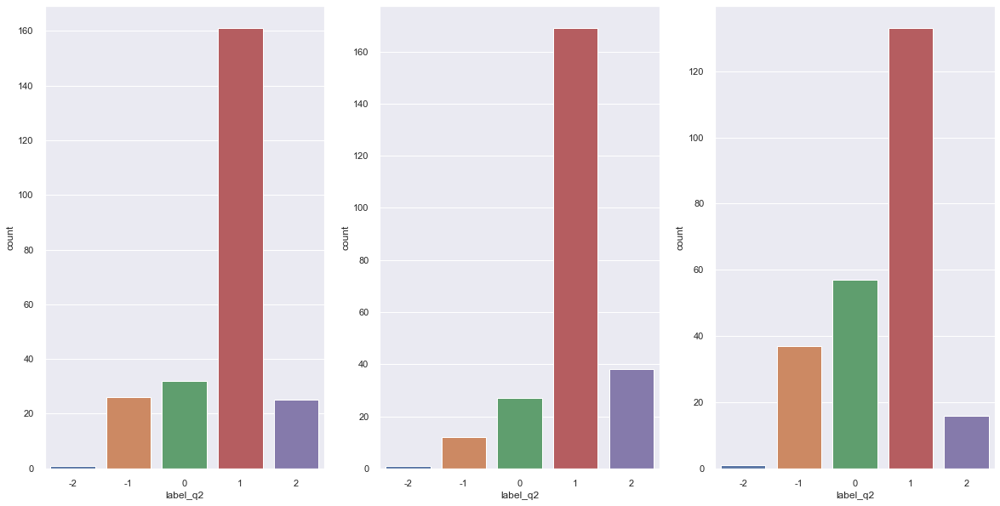

In [409]:
# Condition 1 Nutri-Score
print("----------------- Condition 1 Nutri-Score -----------------")
print(end1['label_q2'].value_counts().to_string())
print("Mean:", end1['label_q2'].mean())

# Condition 2 MTL
print("----------------- Condition 2 MTL -----------------")
print(end2['label_q2'].value_counts().to_string())
print("Mean:", end2['label_q2'].mean())

# Condition 3 No label
print("----------------- Condition 3 No label -----------------")
print(end3['label_q2'].value_counts().to_string())
print("Mean:", end3['label_q2'].mean())

# Compare
fig, axs = plt.subplots(ncols=3)
sns.countplot(x='label_q2', data=end1, ax=axs[0])
sns.countplot(x='label_q2', data=end2, ax=axs[1])
sns.countplot(x='label_q2', data=end3, ax=axs[2])

### 3. Which factors influenced your recipe choices the most?

In [356]:
end1['label_q3'] = end1['label_q3'].str.strip('][')
end1['label_q3'] = end1['label_q3'].str.replace('"', "")
label_q3 = end1['label_q3'].apply(lambda x: x.split(','))
end1_count = pd.Series(sum([item for item in label_q3], [])).value_counts()
end1_count = pd.DataFrame({'Factors':end1_count.index, 'count':end1_count.values})

In [357]:
end2['label_q3'] = end2['label_q3'].str.strip('][')
end2['label_q3'] = end2['label_q3'].str.replace('"', "")
label_q3 = end2['label_q3'].apply(lambda x: x.split(','))
end2_count = pd.Series(sum([item for item in label_q3], [])).value_counts()
end2_count = pd.DataFrame({'Factors':end2_count.index, 'count':end2_count.values})


In [358]:
end3['label_q3'] = end3['label_q3'].str.strip('][')
end3['label_q3'] = end3['label_q3'].str.replace('"', "")
label_q3 = end3['label_q3'].apply(lambda x: x.split(','))
end3_count = pd.Series(sum([item for item in label_q3], [])).value_counts()
end3_count = pd.DataFrame({'Factors':end3_count.index, 'count':end3_count.values})

In [412]:
from IPython.display import display_html
from itertools import chain,cycle
def display_side_by_side(*args,titles=cycle([''])):
    html_str=''
    for df,title in zip(args, chain(titles,cycle(['</br>'])) ):
        html_str+='<th style="text-align:center"><td style="vertical-align:top">'
        html_str+=f'<h2>{title}</h2>'
        html_str+=df.to_html(index=False).replace('table','table style="display:inline"')
        html_str+='</td></th>'
    display_html(html_str,raw=True)
    
display_side_by_side(end1_count,end2_count, end3_count)

Factors,count
image,176
ingredient,102
health,101
title,90
cal,47
rating,45
goals,42
numrating,29
Anticipated taste,1
Access of ingredients and difficulty of making the recipe,1


### Observations: 
* More people in Nutri-Score and MTL said health influenced their recipe choices. 

# Recipe choice questionnaire: Within-subjects variables (Health / Popular / Random ranking) 
* -2 = Strongly disagree
* -1 = Disagree
*  0 = Neither disagree/agree
*  1 = Agree
*  2 = Strongly agree

In [390]:
# Get data for each within-subjects variable

# Condition 1 variants
s1v1 = shown1.loc[shown1['variant'] == 1]
s1v2 = shown1.loc[shown1['variant'] == 2]
s1v3 = shown1.loc[shown1['variant'] == 3]

# Condition 2 variants
s2v1 = shown2.loc[shown2['variant'] == 1]
s2v2 = shown2.loc[shown2['variant'] == 2]
s2v3 = shown2.loc[shown2['variant'] == 3]

# Condition 3 variants
s3v1 = shown3.loc[shown3['variant'] == 1]
s3v2 = shown3.loc[shown3['variant'] == 2]
s3v3 = shown3.loc[shown3['variant'] == 3]

## Are there any obvious differences within-subjects with regards to choice satisfaction?

### 1. I would recommend the chosen recipe to others

----------------- Condition 1 Nutri-Score -----------------
Mean v1: Popular: 0.950207468879668
Mean v2: Random 1.0413223140495869
Mean v3: Health 0.8852459016393442
----------------- Condition 2 MTL -----------------
Mean v1: Popular: 0.9385245901639344
Mean v2: Random 1.0
Mean v3: Health 0.951417004048583
----------------- Condition 3 No label -----------------
Mean v1: Popular: 0.8284518828451883
Mean v2: Random 0.8672199170124482
Mean v3: Health 0.8340248962655602


<AxesSubplot:xlabel='choice_sat_q1', ylabel='count'>

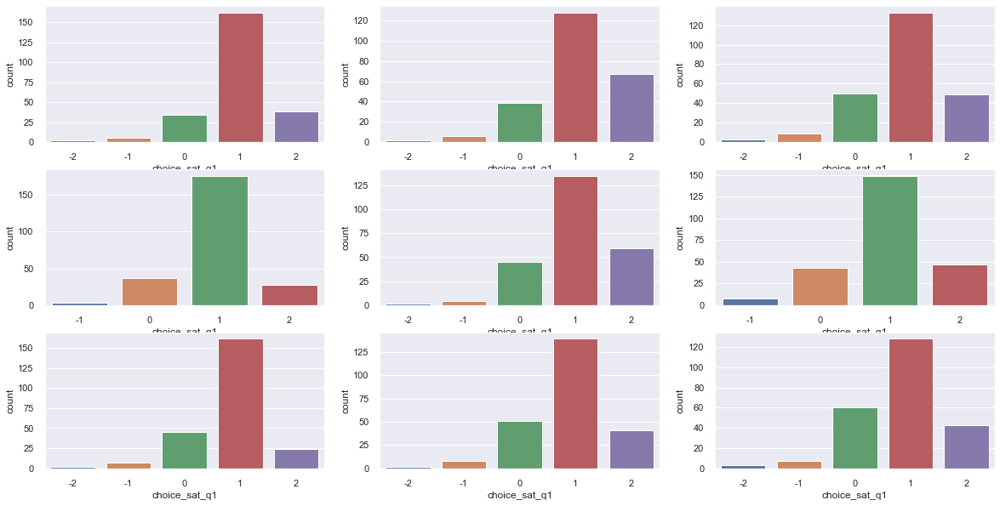

In [415]:
# Compare
print("----------------- Condition 1 Nutri-Score -----------------")
print("Mean v1: Popular:", s1v1['choice_sat_q1'].mean())
print("Mean v2: Random", s1v2['choice_sat_q1'].mean())
print("Mean v3: Health", s1v3['choice_sat_q1'].mean())

print("----------------- Condition 2 MTL -----------------")
print("Mean v1: Popular:", s2v1['choice_sat_q1'].mean())
print("Mean v2: Random", s2v2['choice_sat_q1'].mean())
print("Mean v3: Health", s2v3['choice_sat_q1'].mean())

print("----------------- Condition 3 No label -----------------")
print("Mean v1: Popular:", s3v1['choice_sat_q1'].mean())
print("Mean v2: Random", s3v2['choice_sat_q1'].mean())
print("Mean v3: Health", s3v3['choice_sat_q1'].mean())


fig, axs = plt.subplots(ncols=3, nrows=3)
sns.countplot(x='choice_sat_q1', data=s1v1, ax=axs[0, 0])
sns.countplot(x='choice_sat_q1', data=s1v2, ax=axs[0, 1])
sns.countplot(x='choice_sat_q1', data=s1v3, ax=axs[0, 2])

sns.countplot(x='choice_sat_q1', data=s2v1, ax=axs[1, 0])
sns.countplot(x='choice_sat_q1', data=s2v2, ax=axs[1, 1])
sns.countplot(x='choice_sat_q1', data=s2v3, ax=axs[1, 2])

sns.countplot(x='choice_sat_q1', data=s3v1, ax=axs[2, 0])
sns.countplot(x='choice_sat_q1', data=s3v2, ax=axs[2, 1])
sns.countplot(x='choice_sat_q1', data=s3v3, ax=axs[2, 2])

### 2. My chosen recipe could become one of my favorites

----------------- Condition 1 Nutri-Score -----------------
Mean v1: Popular: -0.38589211618257263
Mean v2: Random -0.21074380165289255
Mean v3: Health -0.4057377049180328
----------------- Condition 2 MTL -----------------
Mean v1: Popular: -0.3155737704918033
Mean v2: Random -0.4204081632653061
Mean v3: Health -0.38866396761133604
----------------- Condition 3 No label -----------------
Mean v1: Popular: -0.35564853556485354
Mean v2: Random -0.4190871369294606
Mean v3: Health -0.3112033195020747


<AxesSubplot:xlabel='choice_sat_q2', ylabel='count'>

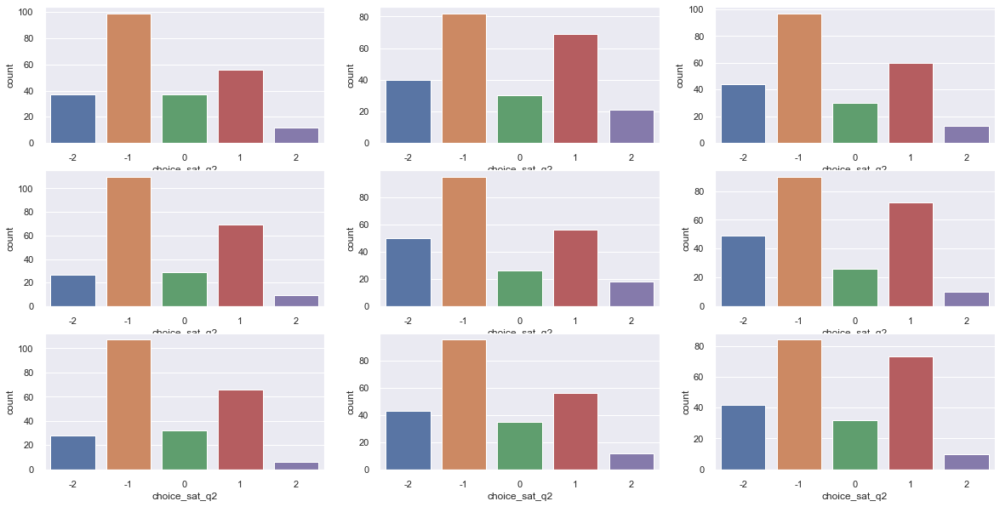

In [416]:
# Compare
print("----------------- Condition 1 Nutri-Score -----------------")
print("Mean v1: Popular:", s1v1['choice_sat_q2'].mean())
print("Mean v2: Random", s1v2['choice_sat_q2'].mean())
print("Mean v3: Health", s1v3['choice_sat_q2'].mean())

print("----------------- Condition 2 MTL -----------------")
print("Mean v1: Popular:", s2v1['choice_sat_q2'].mean())
print("Mean v2: Random", s2v2['choice_sat_q2'].mean())
print("Mean v3: Health", s2v3['choice_sat_q2'].mean())

print("----------------- Condition 3 No label -----------------")
print("Mean v1: Popular:", s3v1['choice_sat_q2'].mean())
print("Mean v2: Random", s3v2['choice_sat_q2'].mean())
print("Mean v3: Health", s3v3['choice_sat_q2'].mean())


fig, axs = plt.subplots(ncols=3, nrows=3)
sns.countplot(x='choice_sat_q2', data=s1v1, ax=axs[0, 0])
sns.countplot(x='choice_sat_q2', data=s1v2, ax=axs[0, 1])
sns.countplot(x='choice_sat_q2', data=s1v3, ax=axs[0, 2])

sns.countplot(x='choice_sat_q2', data=s2v1, ax=axs[1, 0])
sns.countplot(x='choice_sat_q2', data=s2v2, ax=axs[1, 1])
sns.countplot(x='choice_sat_q2', data=s2v3, ax=axs[1, 2])

sns.countplot(x='choice_sat_q2', data=s3v1, ax=axs[2, 0])
sns.countplot(x='choice_sat_q2', data=s3v2, ax=axs[2, 1])
sns.countplot(x='choice_sat_q2', data=s3v3, ax=axs[2, 2])

### 3. I think I would enjoy eating the chosen recipe

----------------- Condition 1 Nutri-Score -----------------
Mean v1: Popular: 0.8672199170124482
Mean v2: Random 0.871900826446281
Mean v3: Health 0.8032786885245902
----------------- Condition 2 MTL -----------------
Mean v1: Popular: 0.7336065573770492
Mean v2: Random 0.8
Mean v3: Health 0.8137651821862348
----------------- Condition 3 No label -----------------
Mean v1: Popular: 0.6820083682008368
Mean v2: Random 0.8091286307053942
Mean v3: Health 0.7344398340248963


<AxesSubplot:xlabel='choice_sat_q3', ylabel='count'>

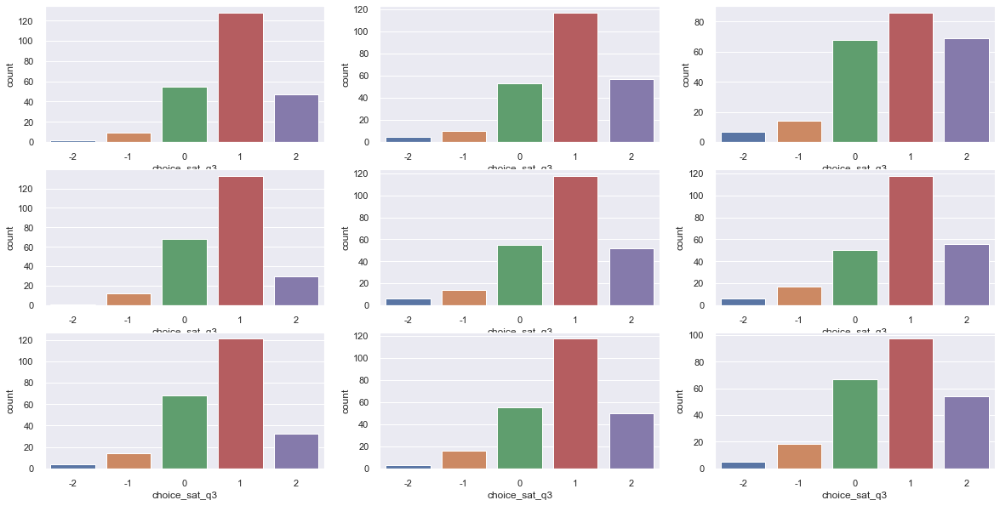

In [417]:
# Compare
print("----------------- Condition 1 Nutri-Score -----------------")
print("Mean v1: Popular:", s1v1['choice_sat_q3'].mean())
print("Mean v2: Random", s1v2['choice_sat_q3'].mean())
print("Mean v3: Health", s1v3['choice_sat_q3'].mean())

print("----------------- Condition 2 MTL -----------------")
print("Mean v1: Popular:", s2v1['choice_sat_q3'].mean())
print("Mean v2: Random", s2v2['choice_sat_q3'].mean())
print("Mean v3: Health", s2v3['choice_sat_q3'].mean())

print("----------------- Condition 3 No label -----------------")
print("Mean v1: Popular:", s3v1['choice_sat_q3'].mean())
print("Mean v2: Random", s3v2['choice_sat_q3'].mean())
print("Mean v3: Health", s3v3['choice_sat_q3'].mean())


fig, axs = plt.subplots(ncols=3, nrows=3)
sns.countplot(x='choice_sat_q3', data=s1v1, ax=axs[0, 0])
sns.countplot(x='choice_sat_q3', data=s1v2, ax=axs[0, 1])
sns.countplot(x='choice_sat_q3', data=s1v3, ax=axs[0, 2])

sns.countplot(x='choice_sat_q3', data=s2v1, ax=axs[1, 0])
sns.countplot(x='choice_sat_q3', data=s2v2, ax=axs[1, 1])
sns.countplot(x='choice_sat_q3', data=s2v3, ax=axs[1, 2])

sns.countplot(x='choice_sat_q3', data=s3v1, ax=axs[2, 0])
sns.countplot(x='choice_sat_q3', data=s3v2, ax=axs[2, 1])
sns.countplot(x='choice_sat_q3', data=s3v3, ax=axs[2, 2])

## Recipe choice questionnaire: Choice difficulty answers
* -2 = Strongly disagree
* -1 = Disagree
*  0 = Neither disagree/agree
*  1 = Agree
*  2 = Strongly agree

### 4. I changed my mind several times before making a decision

----------------- Condition 1 Nutri-Score -----------------
Mean v1: Popular: 1.3609958506224067
Mean v2: Random 1.2479338842975207
Mean v3: Health 1.1639344262295082
----------------- Condition 2 MTL -----------------
Mean v1: Popular: 1.389344262295082
Mean v2: Random 1.2816326530612245
Mean v3: Health 1.2591093117408907
----------------- Condition 3 No label -----------------
Mean v1: Popular: 1.2635983263598327
Mean v2: Random 1.2531120331950207
Mean v3: Health 1.16597510373444


<AxesSubplot:xlabel='choice_sat_q4', ylabel='count'>

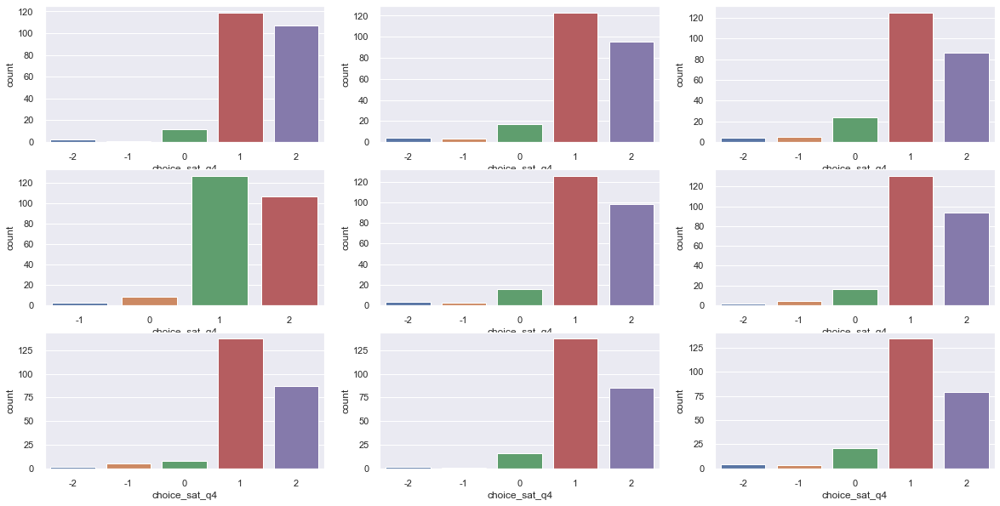

In [418]:
# Compare
print("----------------- Condition 1 Nutri-Score -----------------")
print("Mean v1: Popular:", s1v1['choice_sat_q4'].mean())
print("Mean v2: Random", s1v2['choice_sat_q4'].mean())
print("Mean v3: Health", s1v3['choice_sat_q4'].mean())

print("----------------- Condition 2 MTL -----------------")
print("Mean v1: Popular:", s2v1['choice_sat_q4'].mean())
print("Mean v2: Random", s2v2['choice_sat_q4'].mean())
print("Mean v3: Health", s2v3['choice_sat_q4'].mean())

print("----------------- Condition 3 No label -----------------")
print("Mean v1: Popular:", s3v1['choice_sat_q4'].mean())
print("Mean v2: Random", s3v2['choice_sat_q4'].mean())
print("Mean v3: Health", s3v3['choice_sat_q4'].mean())


fig, axs = plt.subplots(ncols=3, nrows=3)
sns.countplot(x='choice_sat_q4', data=s1v1, ax=axs[0, 0])
sns.countplot(x='choice_sat_q4', data=s1v2, ax=axs[0, 1])
sns.countplot(x='choice_sat_q4', data=s1v3, ax=axs[0, 2])

sns.countplot(x='choice_sat_q4', data=s2v1, ax=axs[1, 0])
sns.countplot(x='choice_sat_q4', data=s2v2, ax=axs[1, 1])
sns.countplot(x='choice_sat_q4', data=s2v3, ax=axs[1, 2])

sns.countplot(x='choice_sat_q4', data=s3v1, ax=axs[2, 0])
sns.countplot(x='choice_sat_q4', data=s3v2, ax=axs[2, 1])
sns.countplot(x='choice_sat_q4', data=s3v3, ax=axs[2, 2])

### 5. It was easy to make this choice

----------------- Condition 1 Nutri-Score -----------------
Mean v1: Popular: 0.7302904564315352
Mean v2: Random 0.6033057851239669
Mean v3: Health 0.4959016393442623
----------------- Condition 2 MTL -----------------
Mean v1: Popular: 0.6188524590163934
Mean v2: Random 0.6285714285714286
Mean v3: Health 0.5587044534412956
----------------- Condition 3 No label -----------------
Mean v1: Popular: 0.5271966527196653
Mean v2: Random 0.5601659751037344
Mean v3: Health 0.4107883817427386


<AxesSubplot:xlabel='choice_sat_q5', ylabel='count'>

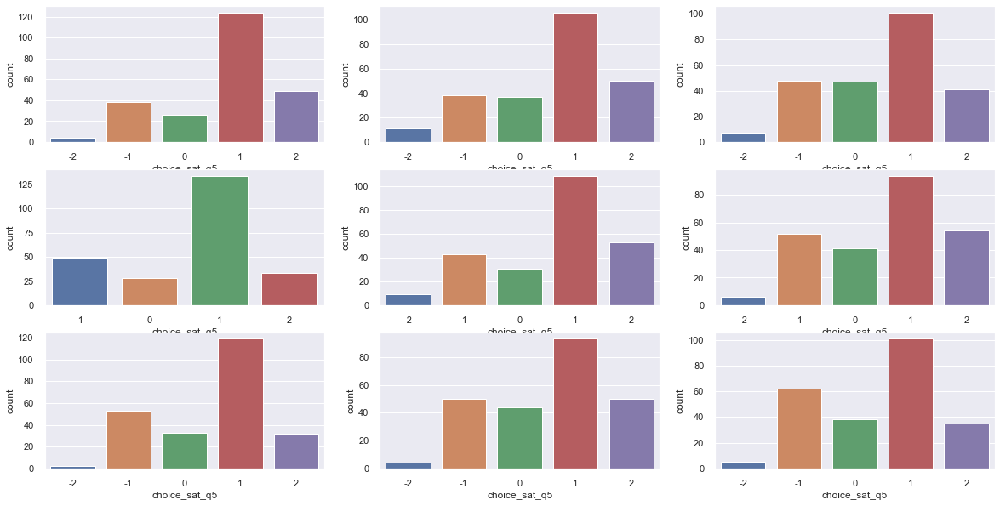

In [419]:
# Compare
print("----------------- Condition 1 Nutri-Score -----------------")
print("Mean v1: Popular:", s1v1['choice_sat_q5'].mean())
print("Mean v2: Random", s1v2['choice_sat_q5'].mean())
print("Mean v3: Health", s1v3['choice_sat_q5'].mean())

print("----------------- Condition 2 MTL -----------------")
print("Mean v1: Popular:", s2v1['choice_sat_q5'].mean())
print("Mean v2: Random", s2v2['choice_sat_q5'].mean())
print("Mean v3: Health", s2v3['choice_sat_q5'].mean())

print("----------------- Condition 3 No label -----------------")
print("Mean v1: Popular:", s3v1['choice_sat_q5'].mean())
print("Mean v2: Random", s3v2['choice_sat_q5'].mean())
print("Mean v3: Health", s3v3['choice_sat_q5'].mean())


fig, axs = plt.subplots(ncols=3, nrows=3)
sns.countplot(x='choice_sat_q5', data=s1v1, ax=axs[0, 0])
sns.countplot(x='choice_sat_q5', data=s1v2, ax=axs[0, 1])
sns.countplot(x='choice_sat_q5', data=s1v3, ax=axs[0, 2])

sns.countplot(x='choice_sat_q5', data=s2v1, ax=axs[1, 0])
sns.countplot(x='choice_sat_q5', data=s2v2, ax=axs[1, 1])
sns.countplot(x='choice_sat_q5', data=s2v3, ax=axs[1, 2])

sns.countplot(x='choice_sat_q5', data=s3v1, ax=axs[2, 0])
sns.countplot(x='choice_sat_q5', data=s3v2, ax=axs[2, 1])
sns.countplot(x='choice_sat_q5', data=s3v3, ax=axs[2, 2])

### 6. Making a choice was overwhelming

----------------- Condition 1 Nutri-Score -----------------
Mean v1: Popular: -0.7136929460580913
Mean v2: Random -0.5454545454545454
Mean v3: Health -0.6270491803278688
----------------- Condition 2 MTL -----------------
Mean v1: Popular: -0.9057377049180327
Mean v2: Random -0.8448979591836735
Mean v3: Health -0.7975708502024291
----------------- Condition 3 No label -----------------
Mean v1: Popular: -0.8535564853556485
Mean v2: Random -0.7551867219917012
Mean v3: Health -0.6970954356846473


<AxesSubplot:xlabel='choice_sat_q6', ylabel='count'>

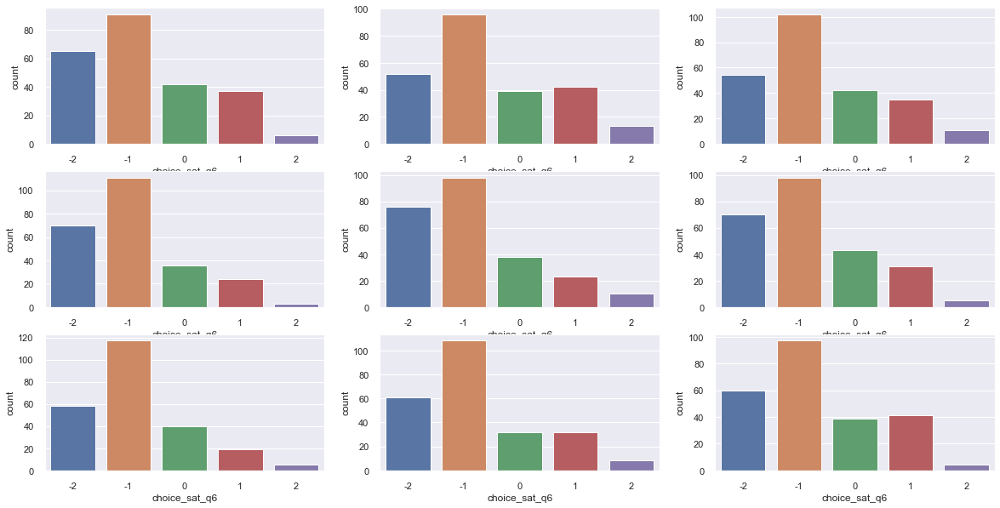

In [420]:
# Compare
print("----------------- Condition 1 Nutri-Score -----------------")
print("Mean v1: Popular:", s1v1['choice_sat_q6'].mean())
print("Mean v2: Random", s1v2['choice_sat_q6'].mean())
print("Mean v3: Health", s1v3['choice_sat_q6'].mean())

print("----------------- Condition 2 MTL -----------------")
print("Mean v1: Popular:", s2v1['choice_sat_q6'].mean())
print("Mean v2: Random", s2v2['choice_sat_q6'].mean())
print("Mean v3: Health", s2v3['choice_sat_q6'].mean())

print("----------------- Condition 3 No label -----------------")
print("Mean v1: Popular:", s3v1['choice_sat_q6'].mean())
print("Mean v2: Random", s3v2['choice_sat_q6'].mean())
print("Mean v3: Health", s3v3['choice_sat_q6'].mean())

fig, axs = plt.subplots(ncols=3, nrows=3)
sns.countplot(x='choice_sat_q6', data=s1v1, ax=axs[0, 0])
sns.countplot(x='choice_sat_q6', data=s1v2, ax=axs[0, 1])
sns.countplot(x='choice_sat_q6', data=s1v3, ax=axs[0, 2])

sns.countplot(x='choice_sat_q6', data=s2v1, ax=axs[1, 0])
sns.countplot(x='choice_sat_q6', data=s2v2, ax=axs[1, 1])
sns.countplot(x='choice_sat_q6', data=s2v3, ax=axs[1, 2])

sns.countplot(x='choice_sat_q6', data=s3v1, ax=axs[2, 0])
sns.countplot(x='choice_sat_q6', data=s3v2, ax=axs[2, 1])
sns.countplot(x='choice_sat_q6', data=s3v3, ax=axs[2, 2])

# PROLIFIC DATA

In [5]:
p1 = pd.read_csv("./Condition_1_nutriscore/prolific_1.csv")
p2 = pd.read_csv("./Condition_1_nutriscore/prolific_2.csv")
p3 = pd.read_csv("./Condition_1_nutriscore/prolific_3.csv")


In [7]:
p1.head()

,session_id,participant_id,status,started_datetime,completed_date_time,time_taken,age,num_approvals,num_rejections,prolific_score,reviewed_at_datetime,entered_code,Country of Birth,Current Country of Residence,Diet Restriction,Employment Status,First Language,Fluent languages,Nationality,Sex,Student Status
0,604cb729c5b705ba4806fe0d,5e9d57aa39a763000dfe2c85,RETURNED,2021-03-13 12:59:21.706000,NaN,3390.040642,26.0,45,0,100,NaN,NaN,CONSENT REVOKED,CONSENT REVOKED,CONSENT REVOKED,CONSENT REVOKED,CONSENT REVOKED,CONSENT REVOKED,CONSENT REVOKED,CONSENT REVOKED,CONSENT REVOKED
1,604cb72f3c7594ea4d0f7263,5ef60100939d49285b4c2003,AWAITING REVIEW,2021-03-13 12:59:27.838000,2021-03-13 13:06:10.482000,402.644000,21.0,80,0,100,NaN,5F069648,Poland,Poland,None,Unemployed (and job seeking),Polish,"Polish, English",Poland,Male,Yes
2,604cb7329a18d3aef5306d0b,5d824ca977546f00016ae679,AWAITING REVIEW,2021-03-13 12:59:30.287000,2021-03-13 13:07:00.136000,449.849000,24.0,129,1,100,NaN,5F069648,Greece,Greece,None,Other,Greek,"Greek, English",Greece,Female,No
3,604cb745158a2afdbe17063f,5e6ff19e7e1daa5be5a93ca8,AWAITING REVIEW,2021-03-13 12:59:49.417000,2021-03-13 13:03:24.522000,215.105000,28.0,100,0,100,NaN,5F069648,Denmark,Denmark,None,Unemployed (and job seeking),Danish,"Danish, English",Denmark,Male,Yes
4,604cb76486089de321782c4c,5af276d65847970001e34e6b,AWAITING REVIEW,2021-03-13 13:00:22.352000,2021-03-13 13:06:20.824000,358.472000,27.0,178,1,100,NaN,5F069648,Malaysia,Germany,Dairy/lactose-free,Part-Time,Malay,"Malay, German, English",Malaysia,Male,Yes


In [9]:
p1['time_taken'].describe()

count     131.000000
mean      619.967421
std       663.773732
min       183.118000
25%       312.750500
50%       400.586000
75%       555.935000
max      3390.040642
Name: time_taken, dtype: float64

In [10]:
p1['time_taken'].describe()

8.333333333333334